# Deep Learning: A Simple Example

- Let's get back to the Name Gender Classifier.

![](../images/keras-workflow.png)

## Prepare Data

In [1]:
## Packages Dependencies
import os
import shutil
import numpy as np
import nltk
from nltk.corpus import names
import random

from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

from lime.lime_text import LimeTextExplainer

import tensorflow as tf
import tensorflow.keras as keras

from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical, plot_model
from keras.models import Sequential
from keras import layers
    # from keras.layers import Dense
    # from keras.layers import LSTM, RNN, GRU
    # from keras.layers import Embedding
    # from keras.layers import SpatialDropout1D

import kerastuner

In [2]:
labeled_names = ([(name, 1) for name in names.words('male.txt')] +
                 [(name, 0) for name in names.words('female.txt')])
random.shuffle(labeled_names)

## Train-Test Split

In [3]:
train_set, test_set = train_test_split(labeled_names,
                                       test_size=0.2,
                                       random_state=42)
print(len(train_set), len(test_set))

6355 1589


In [4]:
names = [n for (n, l) in train_set]
labels = [l for (n, l) in train_set]

In [5]:
len(names)

6355

## Tokenizer

- By default, the token index 0 is reserved for padding token.
- If `oov_token` is specified, it is default to index 1.
- Specify `num_words` for tokenizer to include only top N words in the model
- Tokenizer will automatically remove puntuations.
- Tokenizer use whitespace as word delimiter.
- If every character is treated as a token, specify `char_level=True`.

In [6]:
tokenizer = Tokenizer(char_level=True)
tokenizer.fit_on_texts(names) ## similar to CountVectorizer.fit_transform()

## Prepare Input and Output Tensors

- Like in feature-based machine translation, a computational model only accepts numeric values. It is necessary to convert raw text to numeric tensor for neural network.
- After we create the Tokenizer, we use the Tokenizer to perform text vectorization, i.e., converting texts into tensors.
- In deep learning, words or characters are automatically converted into numeric representations.
- In other words, the feature engineering step is fully automatic.

### Two Ways of Text Vectorization

- Texts to Sequences: **Integer encoding** of tokens in texts and learn token **embeddings**
- Texts to Matrix: **One-hot encoding** of texts (similar to bag-of-words model)


## Method 1: Text to Sequences

### From Texts and Sequences

- Text to Sequences
- Padding to uniform lengths for each text

In [7]:
names_ints = tokenizer.texts_to_sequences(names)

In [8]:
print(names[:10])
print(names_ints[:10])
print(labels[:10])

['Trina', 'Henrie', 'Nola', 'Margo', 'Kaitlyn', 'Anne-Marie', 'Vaughn', 'Winona', 'Pate', 'Gabrielle']
[[8, 5, 3, 4, 1], [13, 2, 4, 5, 3, 2], [4, 7, 6, 1], [11, 1, 5, 17, 7], [18, 1, 3, 8, 6, 12, 4], [1, 4, 4, 2, 27, 11, 1, 5, 3, 2], [20, 1, 16, 17, 13, 4], [23, 3, 4, 7, 4, 1], [22, 1, 8, 2], [17, 1, 15, 5, 3, 2, 6, 6, 2]]
[0, 0, 0, 0, 0, 0, 1, 0, 1, 0]


### Vocabulary

In [9]:
# determine the vocabulary size
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

Vocabulary Size: 29


In [10]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'm': 11,
 'y': 12,
 'h': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'j': 19,
 'v': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28}

### Padding

- When padding the all texts into uniform lengths, consider whether to Pre-padding or removing values from the beginning of the sequence (i.e., `pre`) or the other way (`post`).
-  Check `padding` and `truncating` parameters in `pad_sequences`

Jean-Christophe


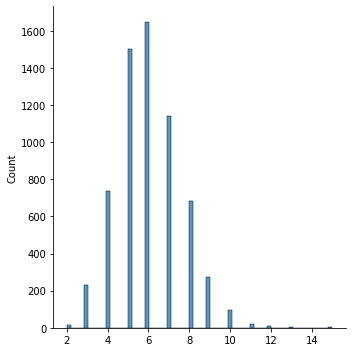

In [11]:
names_lens = [len(n) for n in names_ints]
names_lens

sns.displot(names_lens)
print(names[np.argmax(names_lens)])  # longest name

In [12]:
max_len = names_lens[np.argmax(names_lens)]
max_len

15

In [13]:
names_ints_pad = sequence.pad_sequences(names_ints, maxlen=max_len)
names_ints_pad[:10]

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  8,  5,  3,  4,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 13,  2,  4,  5,  3,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  7,  6,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 11,  1,  5, 17,  7],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 18,  1,  3,  8,  6, 12,  4],
       [ 0,  0,  0,  0,  0,  1,  4,  4,  2, 27, 11,  1,  5,  3,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  1, 16, 17, 13,  4],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 23,  3,  4,  7,  4,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 22,  1,  8,  2],
       [ 0,  0,  0,  0,  0,  0, 17,  1, 15,  5,  3,  2,  6,  6,  2]],
      dtype=int32)

### Define X and Y

In [14]:
X_train = np.array(names_ints_pad).astype('int32')
y_train = np.array(labels)

X_test = np.array(
    sequence.pad_sequences(tokenizer.texts_to_sequences(
        [n for (n, l) in test_set]),
                           maxlen=max_len)).astype('int32')
y_test = np.array([l for (n, l) in test_set])

X_test_texts = [n for (n, l) in test_set]

In [15]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6355, 15)
(6355,)
(1589, 15)
(1589,)


## Method 2: Text to Matrix

### One-Hot Encoding

- Text to Matrix (to create bag-of-word representation of each text)
- Choose modes: binary, count, or tfidf

In [16]:
names_matrix = tokenizer.texts_to_matrix(names, mode="binary")

In [17]:
names[2]

'Nola'

- `names_matrix` in fact is a bag-of-characters representation of a name text.

In [18]:
pd.DataFrame(names_matrix[2, 1:],
             columns=["ONE-HOT"],
             index=list(tokenizer.word_index.keys()))

,ONE-HOT
a,1.0
e,0.0
i,0.0
n,1.0
r,0.0
l,1.0
o,1.0
t,0.0
s,0.0
d,0.0


### Define X and Y

In [19]:
X_train2 = np.array(names_matrix).astype('int32')
y_train2 = np.array(labels)

X_test2 = tokenizer.texts_to_matrix([n for (n, l) in test_set],
                                    mode="binary").astype('int32')
y_test2 = np.array([l for (n, l) in test_set])

X_test2_texts = [n for (n, l) in test_set]

In [20]:
print(X_train2.shape)
print(y_train2.shape)
print(X_test2.shape)
print(y_test2.shape)

(6355, 29)
(6355,)
(1589, 29)
(1589,)


## Model Definition

- Three important steps for building a deep neural network:
    - **Define** the model structure 
    - **Compile** the model
    - **Fit** the model

- After we have defined our input and output tensors (X and y), we can define the architecture of our neural network model.
- For the two ways of name vectorized representations, we try two different network structures.
    - Text to Matrix: Fully connected Dense Layers
    - Text to Sequences: Embedding + RNN


In [21]:
# Plotting results
def plot1(history):

    matplotlib.rcParams['figure.dpi'] = 100
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)
    ## Accuracy plot
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    ## Loss plot
    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()


def plot2(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    #plt.gca().set_ylim(0,1)
    plt.show()

### Model 1: Fully Connected Dense Layers

- Let's try a simple neural network with two fully-connected dense layers with the Text-to-Matrix inputs.
- That is, the input of this model is the bag-of-words representation of the entire name.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.002.jpeg)

#### Dense Layer Operation

- The transformation of each Dense layer will transform the input tensor into a tensor whose dimension size is the same as the node number of the Dense layer.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.003.jpeg)

In [22]:
## Define Model

model1 = keras.Sequential()
model1.add(keras.Input(shape=(vocab_size, ), name="one_hot_input"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_1"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_2"))
model1.add(layers.Dense(1, activation="sigmoid", name="output"))

In [23]:
## Compile Model
model1.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

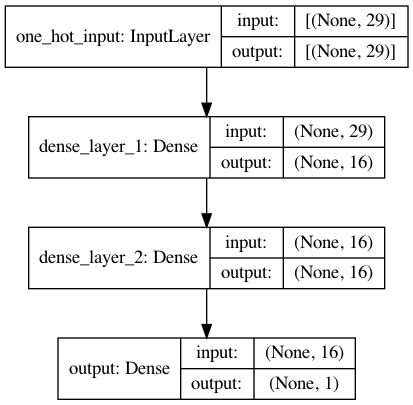

In [24]:
plot_model(model1, show_shapes=True)

#### A few hyperparameters for network training

- Batch Size: The number of inputs needed per update of the model parameter (gradient descent)
- Epoch: How many iterations needed for training
- Validation Split Ratio: Proportion of validation and training data split

In [25]:
## Hyperparameters
BATCH_SIZE = 128
EPOCHS = 20
VALIDATION_SPLIT = 0.2

In [26]:
## Fit the model
history1 = model1.fit(X_train2,
                      y_train2,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6760 - accuracy: 0.5983 - val_loss: 0.6563 - val_accuracy: 0.6349
Epoch 2/20
40/40 - 0s - loss: 0.6432 - accuracy: 0.6361 - val_loss: 0.6329 - val_accuracy: 0.6452
Epoch 3/20
40/40 - 0s - loss: 0.6245 - accuracy: 0.6544 - val_loss: 0.6152 - val_accuracy: 0.6696
Epoch 4/20
40/40 - 0s - loss: 0.6084 - accuracy: 0.6733 - val_loss: 0.5989 - val_accuracy: 0.6821
Epoch 5/20
40/40 - 0s - loss: 0.5962 - accuracy: 0.6819 - val_loss: 0.5887 - val_accuracy: 0.6845
Epoch 6/20
40/40 - 0s - loss: 0.5880 - accuracy: 0.6908 - val_loss: 0.5826 - val_accuracy: 0.6924
Epoch 7/20
40/40 - 0s - loss: 0.5809 - accuracy: 0.6971 - val_loss: 0.5762 - val_accuracy: 0.6994
Epoch 8/20
40/40 - 0s - loss: 0.5754 - accuracy: 0.7038 - val_loss: 0.5726 - val_accuracy: 0.7073
Epoch 9/20
40/40 - 0s - loss: 0.5714 - accuracy: 0.7065 - val_loss: 0.5703 - val_accuracy: 0.7073
Epoch 10/20
40/40 - 0s - loss: 0.5674 - accuracy: 0.7107 - val_loss: 0.5664 - val_accuracy: 0.7120
Epoch 11/20
40/40 -

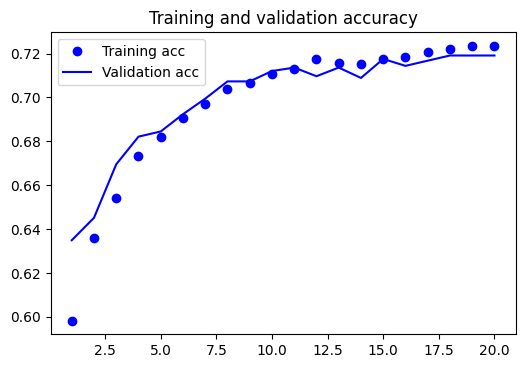

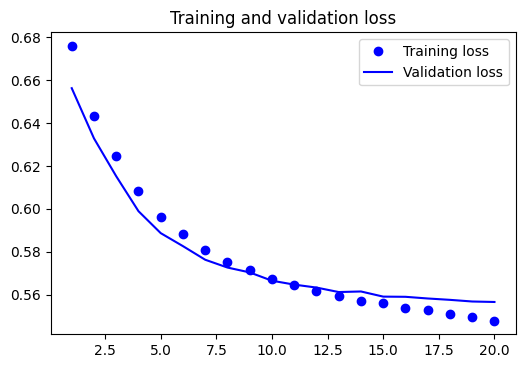

In [27]:
plot1(history1)

In [28]:
model1.evaluate(X_test2, y_test2, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.5794 - accuracy: 0.7036


[0.5793769955635071, 0.7035871744155884]

### Model 2: Embedding + RNN

- Another possibility is to introduce an embedding layer in the network, which transforms each **character** in the name into a tensor (i.e., embeddings), and then to add a Recurrent Neural Network layer to process each character sequentially.
- The strength of the RNN is that it iterates over the **timesteps** of a sequence, while maintaining an internal state that encodes information about the **timesteps** it has seen so far.
- It is posited that after the RNN iterates through the entire sequence, it keeps important information of all previously iterated tokens for further operation.

- The input of this network is a padded sequence of the original text (name).

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.004.jpeg)

#### Embedding Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.005.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.006.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.007.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.008.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.009.jpeg)

In [29]:
## Define the embedding dimension
EMBEDDING_DIM = 128

## Define model
model2 = Sequential()
model2.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model2.add(layers.SimpleRNN(16, activation="relu", name="RNN_layer"))
model2.add(layers.Dense(16, activation="relu", name="dense_layer"))
model2.add(layers.Dense(1, activation="sigmoid", name="output"))

model2.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

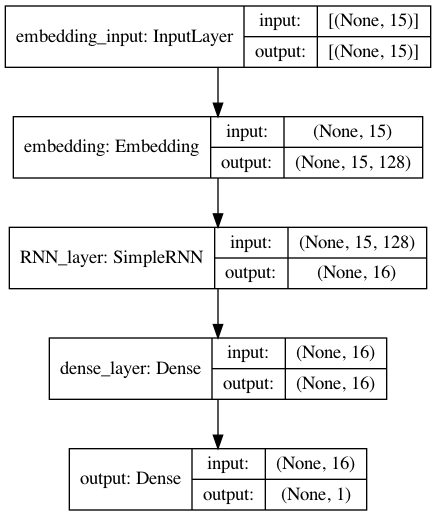

In [30]:
plot_model(model2, show_shapes=True)

In [31]:
history2 = model2.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6259 - accuracy: 0.6727 - val_loss: 0.5308 - val_accuracy: 0.7435
Epoch 2/20
40/40 - 0s - loss: 0.4852 - accuracy: 0.7598 - val_loss: 0.4368 - val_accuracy: 0.7884
Epoch 3/20
40/40 - 0s - loss: 0.4331 - accuracy: 0.7840 - val_loss: 0.4132 - val_accuracy: 0.7986
Epoch 4/20
40/40 - 0s - loss: 0.4161 - accuracy: 0.7978 - val_loss: 0.4086 - val_accuracy: 0.8033
Epoch 5/20
40/40 - 0s - loss: 0.4066 - accuracy: 0.8037 - val_loss: 0.4082 - val_accuracy: 0.7915
Epoch 6/20
40/40 - 0s - loss: 0.4002 - accuracy: 0.8076 - val_loss: 0.4080 - val_accuracy: 0.7907
Epoch 7/20
40/40 - 0s - loss: 0.3943 - accuracy: 0.8120 - val_loss: 0.4030 - val_accuracy: 0.8057
Epoch 8/20
40/40 - 0s - loss: 0.3878 - accuracy: 0.8125 - val_loss: 0.4023 - val_accuracy: 0.7939
Epoch 9/20
40/40 - 0s - loss: 0.3854 - accuracy: 0.8143 - val_loss: 0.4010 - val_accuracy: 0.8009
Epoch 10/20
40/40 - 0s - loss: 0.3802 - accuracy: 0.8208 - val_loss: 0.3986 - val_accuracy: 0.8120
Epoch 11/20
40/40 -

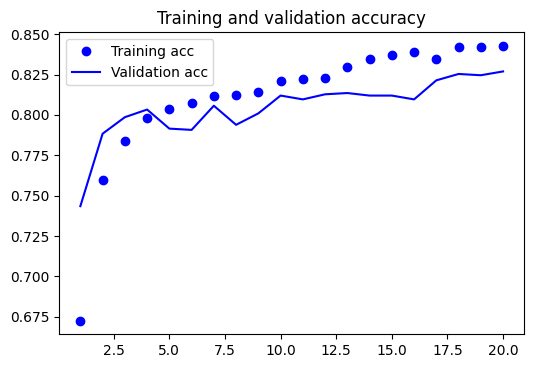

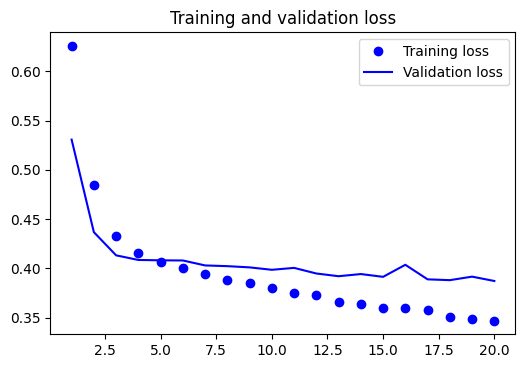

In [32]:
plot1(history2)

In [33]:
model2.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4387 - accuracy: 0.7948


[0.438721626996994, 0.7948395013809204]

### Model 3: Regularization and Dropout

- Based on the validation results of the previous two models, we can see that they are probably a bit overfit because the model performance on the validation set starts to stall after the first few epochs.
- We can add **regularization** and **dropouts** in our network definition to avoid overfitting.

In [34]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model3 = Sequential()
model3.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model3.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer",
                     dropout=0.2,
                     recurrent_dropout=0.2))  ## add dropout
model3.add(layers.Dense(16, activation="relu", name="dense_layer"))
model3.add(layers.Dense(1, activation="sigmoid", name="output"))

model3.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

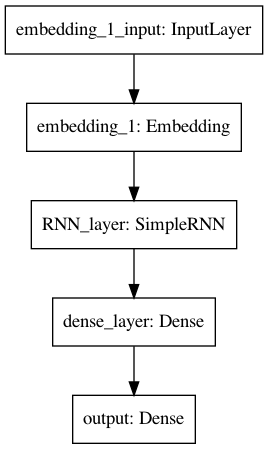

In [35]:
plot_model(model3)

In [36]:
history3 = model3.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 3s - loss: 0.6105 - accuracy: 0.6367 - val_loss: 0.5248 - val_accuracy: 0.6869
Epoch 2/20
40/40 - 0s - loss: 0.5100 - accuracy: 0.7356 - val_loss: 0.4604 - val_accuracy: 0.7836
Epoch 3/20
40/40 - 0s - loss: 0.4742 - accuracy: 0.7632 - val_loss: 0.4385 - val_accuracy: 0.7923
Epoch 4/20
40/40 - 0s - loss: 0.4504 - accuracy: 0.7842 - val_loss: 0.4225 - val_accuracy: 0.7970
Epoch 5/20
40/40 - 0s - loss: 0.4462 - accuracy: 0.7805 - val_loss: 0.4202 - val_accuracy: 0.8009
Epoch 6/20
40/40 - 0s - loss: 0.4379 - accuracy: 0.7872 - val_loss: 0.4171 - val_accuracy: 0.8025
Epoch 7/20
40/40 - 0s - loss: 0.4389 - accuracy: 0.7823 - val_loss: 0.4164 - val_accuracy: 0.8033
Epoch 8/20
40/40 - 0s - loss: 0.4316 - accuracy: 0.7907 - val_loss: 0.4112 - val_accuracy: 0.8033
Epoch 9/20
40/40 - 0s - loss: 0.4266 - accuracy: 0.7887 - val_loss: 0.4096 - val_accuracy: 0.8033
Epoch 10/20
40/40 - 0s - loss: 0.4285 - accuracy: 0.7982 - val_loss: 0.4074 - val_accuracy: 0.8104
Epoch 11/20
40/40 -

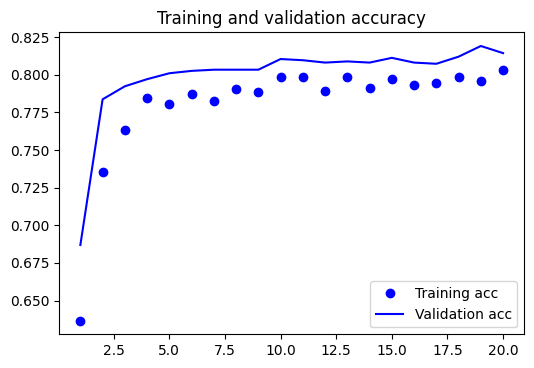

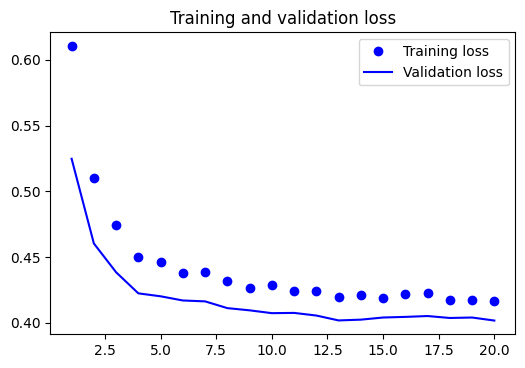

In [37]:
plot1(history3)

In [38]:
model3.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4364 - accuracy: 0.7948


[0.4364217221736908, 0.7948395013809204]

### Model 4: Improve the Models

- In addition to regularization and dropouts, we can further improve the model by increasing the model **complexity**.
- In particular, we can increase the **depths** and **widths** of the network layers.
- Let's try stacking two RNN layers.

:::{tip}

When we stack two sequence layers (e.g., RNN), we need to make sure that the hidden states (outputs) of the first sequence layer at **all timesteps** are properly passed onto the next sequence layer, not just the hidden state (output) of the last timestep.

In keras, this usually means that we need to set the argument `return_sequences=True` in a sequence layer (e.g., `SimpleRNN`, `LSTM`, `GRU` etc).

:::

In [39]:
## Define embedding dimension
MBEDDING_DIM = 128

## Define model
model4 = Sequential()
model4.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_1",
                     dropout=0.2,
                     recurrent_dropout=0.5,
                     return_sequences=True)
)  ## To ensure the hidden states of all timesteps are pased down to next layer
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_2",
                     dropout=0.2,
                     recurrent_dropout=0.5))
model4.add(layers.Dense(1, activation="sigmoid", name="output"))

## Compile model
model4.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

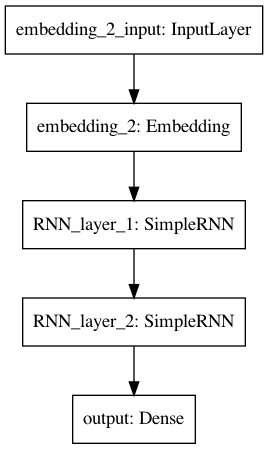

In [40]:
plot_model(model4)

In [41]:
history4 = model4.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 3s - loss: 0.6826 - accuracy: 0.5974 - val_loss: 0.6565 - val_accuracy: 0.6585
Epoch 2/20
40/40 - 0s - loss: 0.6225 - accuracy: 0.6577 - val_loss: 0.5643 - val_accuracy: 0.7073
Epoch 3/20
40/40 - 0s - loss: 0.5604 - accuracy: 0.6878 - val_loss: 0.5136 - val_accuracy: 0.7710
Epoch 4/20
40/40 - 0s - loss: 0.5202 - accuracy: 0.7248 - val_loss: 0.4880 - val_accuracy: 0.7718
Epoch 5/20
40/40 - 0s - loss: 0.5092 - accuracy: 0.7347 - val_loss: 0.4768 - val_accuracy: 0.7734
Epoch 6/20
40/40 - 0s - loss: 0.5030 - accuracy: 0.7327 - val_loss: 0.4680 - val_accuracy: 0.7750
Epoch 7/20
40/40 - 0s - loss: 0.4890 - accuracy: 0.7520 - val_loss: 0.4594 - val_accuracy: 0.7718
Epoch 8/20
40/40 - 0s - loss: 0.4828 - accuracy: 0.7510 - val_loss: 0.4529 - val_accuracy: 0.7734
Epoch 9/20
40/40 - 1s - loss: 0.4831 - accuracy: 0.7492 - val_loss: 0.4512 - val_accuracy: 0.7663
Epoch 10/20
40/40 - 1s - loss: 0.4763 - accuracy: 0.7494 - val_loss: 0.4484 - val_accuracy: 0.7789
Epoch 11/20
40/40 -

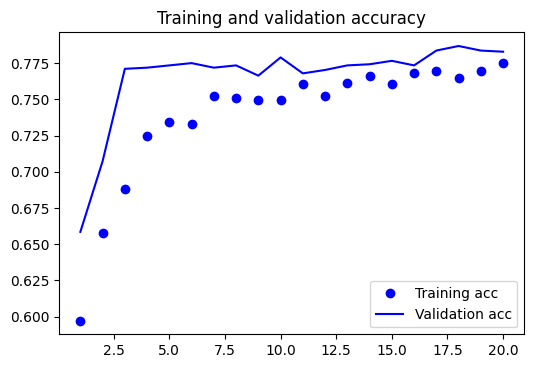

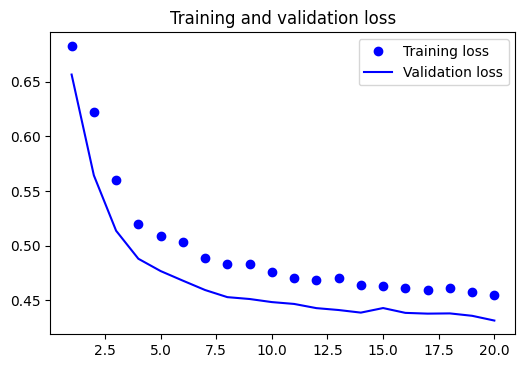

In [42]:
plot1(history4)

In [43]:
model4.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4596 - accuracy: 0.7867


[0.459642618894577, 0.7866582870483398]

### Model 5: Bidirectional

- We can also increase the model complexity in at least two possible ways:
    - Use more advanced RNNs, such as LSTM or GRU
    - Process the sequence in two directions
    - Increase the hidden nodes of the RNN/LSTM
- Now let's try the more sophisticated RNN, LSTM, and with bidirectional sequence processing and add more nodes to the LSTM layer.

In [44]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model5 = Sequential()
model5.add(
    layers.Embedding(input_dim=vocab_size,
                      output_dim=EMBEDDING_DIM,
                      input_length=max_len,
                      mask_zero=True))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_1",
                    dropout=0.2,
                    recurrent_dropout=0.5,
                    return_sequences=True)))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_2",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model5.add(layers.Dense(1, activation="sigmoid", name="output"))

model5.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

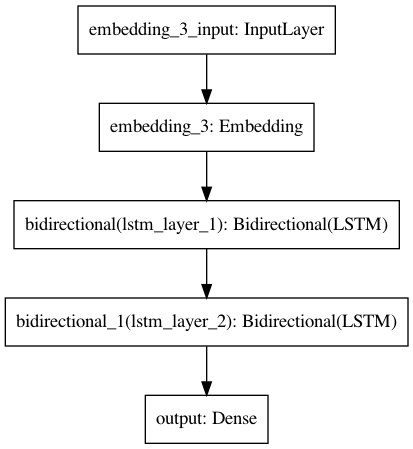

In [45]:
plot_model(model5)

In [46]:
history5 = model5.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 15s - loss: 0.6669 - accuracy: 0.6123 - val_loss: 0.6306 - val_accuracy: 0.6286
Epoch 2/20
40/40 - 2s - loss: 0.6000 - accuracy: 0.6503 - val_loss: 0.5324 - val_accuracy: 0.7270
Epoch 3/20
40/40 - 2s - loss: 0.5212 - accuracy: 0.7439 - val_loss: 0.4815 - val_accuracy: 0.7530
Epoch 4/20
40/40 - 2s - loss: 0.4823 - accuracy: 0.7608 - val_loss: 0.4658 - val_accuracy: 0.7687
Epoch 5/20
40/40 - 2s - loss: 0.4651 - accuracy: 0.7720 - val_loss: 0.4380 - val_accuracy: 0.7821
Epoch 6/20
40/40 - 2s - loss: 0.4527 - accuracy: 0.7789 - val_loss: 0.4359 - val_accuracy: 0.7828
Epoch 7/20
40/40 - 2s - loss: 0.4412 - accuracy: 0.7848 - val_loss: 0.4196 - val_accuracy: 0.7939
Epoch 8/20
40/40 - 2s - loss: 0.4268 - accuracy: 0.7992 - val_loss: 0.4136 - val_accuracy: 0.7946
Epoch 9/20
40/40 - 2s - loss: 0.4276 - accuracy: 0.7919 - val_loss: 0.4070 - val_accuracy: 0.8009
Epoch 10/20
40/40 - 2s - loss: 0.4194 - accuracy: 0.8002 - val_loss: 0.4022 - val_accuracy: 0.8057
Epoch 11/20
40/40 

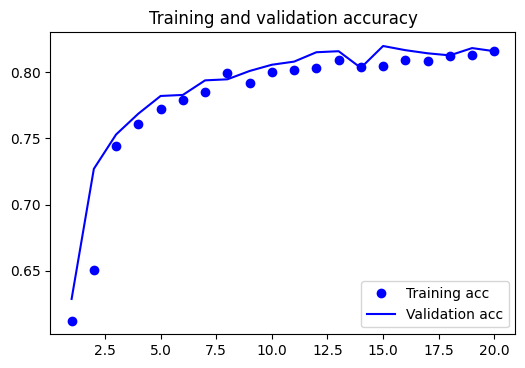

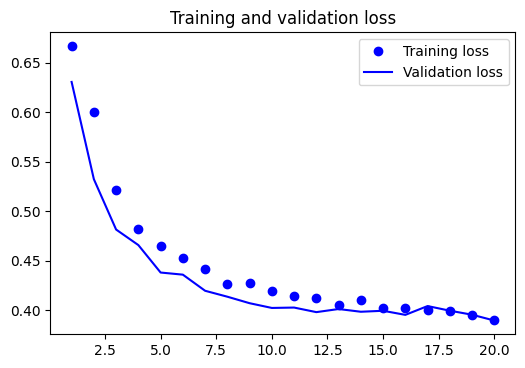

In [47]:
plot1(history5)

In [48]:
model5.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4204 - accuracy: 0.8037


[0.4203791618347168, 0.8036500811576843]

## Check Embeddings

- Compared to one-hot encodings of characters, embeddings may include more information relating to the characteristics (semantics?) of the characters.
- We can extract the embedding layer and apply dimensional reduction techniques (i.e., TSNE) to see how embeddings capture the relationships in-between characters.

In [49]:
## A name in sequence from test set
X_test[10]

array([0, 0, 0, 0, 0, 0, 0, 1, 4, 1, 6, 6, 2, 9, 2], dtype=int32)

In [50]:
ind2char = tokenizer.index_word
[ind2char.get(i) for i in X_test[10] if ind2char.get(i) != None]

['a', 'n', 'a', 'l', 'l', 'e', 's', 'e']

In [51]:
tokenizer.texts_to_sequences('Alvin')

[[1], [6], [20], [3], [4]]

In [52]:
char_vectors = model5.layers[0].get_weights()[0]
char_vectors.shape

(29, 128)

In [53]:
labels = [char for (ind, char) in tokenizer.index_word.items()]
labels.insert(0, None)
labels

[None,
 'a',
 'e',
 'i',
 'n',
 'r',
 'l',
 'o',
 't',
 's',
 'd',
 'm',
 'y',
 'h',
 'c',
 'b',
 'u',
 'g',
 'k',
 'j',
 'v',
 'f',
 'p',
 'w',
 'z',
 'x',
 'q',
 '-',
 ' ']

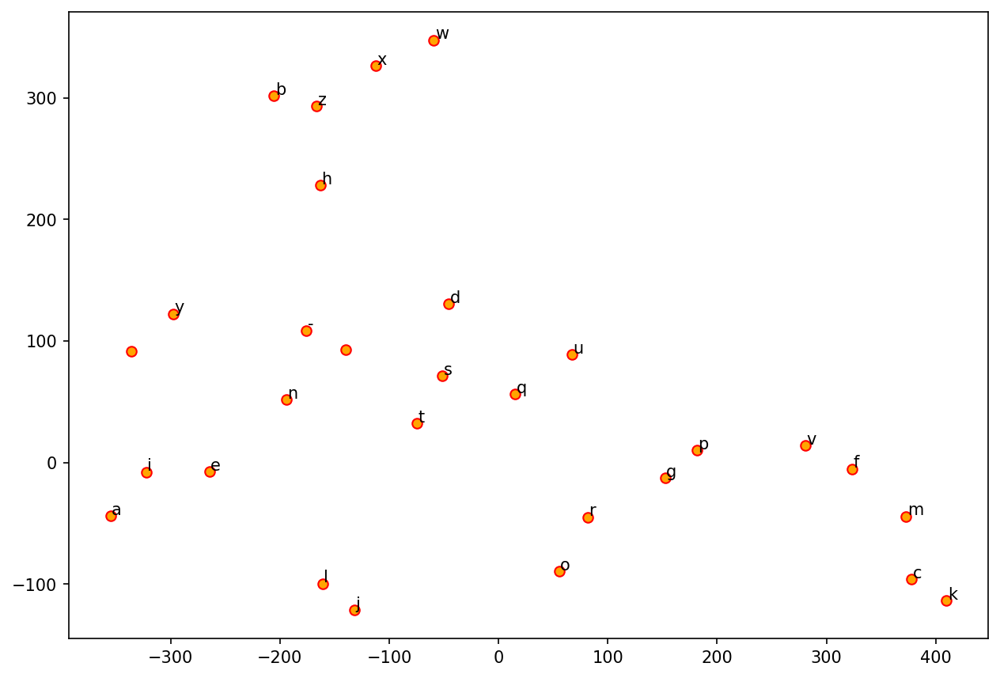

In [54]:
tsne = TSNE(n_components=2, random_state=0, n_iter=5000, perplexity=3)
np.set_printoptions(suppress=True)
T = tsne.fit_transform(char_vectors)
labels = labels

plt.figure(figsize=(10, 7), dpi=150)
plt.scatter(T[:, 0], T[:, 1], c='orange', edgecolors='r')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label,
                 xy=(x + 1, y + 1),
                 xytext=(0, 0),
                 textcoords='offset points')

## Issues of Word/Character Representations

- One-hot encoding does not indicate semantic relationships between characters.
- For deep learning NLP, it is preferred to convert one-hot encodings of words/characters into **embeddings**, which are argued to include more semantic information of the tokens.
- Now the question is how to train and create better word embeddings. We will come back to this issue later.

## Hyperparameter Tuning

:::{note}

Please install keras tuner module in your current conda:

```
pip install -U keras-tuner
```

or 

```
conda install -c conda-forge keras-tuner
```

:::

- Like feature-based ML methods, neural networks also come with many hyperparameters, which require default values.
- Typical hyperparameters include:
    - Number of nodes for the layer
    - Learning Rates
- We can utilize the module, [`keras-tuner`](https://keras-team.github.io/keras-tuner/documentation/tuners/), to fine-tune the hyperparameters (i.e., to find the values that optimize the model performance).

- Steps for Keras Tuner
    - First, wrap the model definition in a function, which takes a single `hp` argument. 
    - Inside this function, replace any value we want to tune with a call to hyperparameter sampling methods, e.g. `hp.Int()` or `hp.Choice()`. The function should return a compiled model.
    - Next, instantiate a `tuner` object specifying our optimization objective and other search parameters.
    - Finally, start the search with the `search()` method, which takes the same arguments as `Model.fit()` in keras.
    - When the search is over, we can retrieve the best model and a summary of the results from the `tunner`.


In [55]:
## confirm if the right kernel is being used
# import sys
# sys.executable

In [56]:
## Wrap model definition in a function
## and specify the parameters needed for tuning
# def build_model(hp):
#     model1 = keras.Sequential()
#     model1.add(keras.Input(shape=(max_len,)))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_1"))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_2"))
#     model1.add(layers.Dense(2, activation="softmax", name="output"))
#     model1.compile(
#         optimizer=keras.optimizers.Adam(
#             hp.Choice('learning_rate',
#                       values=[1e-2, 1e-3, 1e-4])),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'])
#     return model1

In [57]:
def build_model(hp):
    m = Sequential()
    m.add(
        layers.Embedding(
            input_dim=vocab_size,
            output_dim=hp.Int(
                'output_dim',  ## tuning 2
                min_value=32,
                max_value=128,
                step=32),
            input_length=max_len,
            mask_zero=True))
    m.add(
        layers.Bidirectional(
            layers.LSTM(
                hp.Int('units', min_value=16, max_value=64,
                       step=16),  ## tuning 1
                activation="relu",
                dropout=0.2,
                recurrent_dropout=0.2)))
    m.add(layers.Dense(1, activation="sigmoid", name="output"))

    m.compile(loss=keras.losses.BinaryCrossentropy(),
              optimizer=keras.optimizers.Adam(lr=0.001),
              metrics=["accuracy"])
    return m

In [58]:
## This is to clean up the temp dir from the tuner
## Every time we re-start the tunner, it's better to keep the temp dir clean

if os.path.isdir('my_dir'):
    shutil.rmtree('my_dir')

- The `max_trials` variable represents the maximum number of trials that a hyperparameter combination would run.
- The `execution_per_trial` variable is the number of models that should be built and fit for each trial for robustness purposes.

In [59]:
## Instantiate the tunner

tuner = kerastuner.tuners.RandomSearch(build_model,
                                       objective='val_accuracy',
                                       max_trials=10,
                                       executions_per_trial=2,
                                       directory='my_dir')

In [60]:
## Check the tuner's search space
tuner.search_space_summary()

In [61]:
%%time
## Start tuning with the tuner
tuner.search(X_train, y_train, validation_split=0.2, batch_size=128)

40/40 [==============================] - ETA: 3:32 - loss: 0.6942 - accuracy: 0.35 - ETA: 1s - loss: 0.6936 - accuracy: 0.4249 - ETA: 1s - loss: 0.6927 - accuracy: 0.47 - ETA: 1s - loss: 0.6918 - accuracy: 0.50 - ETA: 1s - loss: 0.6910 - accuracy: 0.51 - ETA: 0s - loss: 0.6901 - accuracy: 0.53 - ETA: 0s - loss: 0.6892 - accuracy: 0.54 - ETA: 0s - loss: 0.6883 - accuracy: 0.55 - ETA: 0s - loss: 0.6873 - accuracy: 0.56 - ETA: 0s - loss: 0.6864 - accuracy: 0.56 - ETA: 0s - loss: 0.6855 - accuracy: 0.57 - ETA: 0s - loss: 0.6847 - accuracy: 0.57 - ETA: 0s - loss: 0.6839 - accuracy: 0.57 - ETA: 0s - loss: 0.6830 - accuracy: 0.58 - ETA: 0s - loss: 0.6822 - accuracy: 0.58 - ETA: 0s - loss: 0.6813 - accuracy: 0.58 - ETA: 0s - loss: 0.6805 - accuracy: 0.58 - ETA: 0s - loss: 0.6796 - accuracy: 0.58 - ETA: 0s - loss: 0.6787 - accuracy: 0.59 - ETA: 0s - loss: 0.6779 - accuracy: 0.59 - 7s 51ms/step - loss: 0.6770 - accuracy: 0.5930 - val_loss: 0.6204 - val_accuracy: 0.6286


40/40 [==============================] - ETA: 3:34 - loss: 0.6938 - accuracy: 0.42 - ETA: 0s - loss: 0.6931 - accuracy: 0.4897 - ETA: 0s - loss: 0.6924 - accuracy: 0.52 - ETA: 0s - loss: 0.6919 - accuracy: 0.54 - ETA: 0s - loss: 0.6912 - accuracy: 0.55 - ETA: 0s - loss: 0.6906 - accuracy: 0.56 - ETA: 0s - loss: 0.6899 - accuracy: 0.56 - ETA: 0s - loss: 0.6895 - accuracy: 0.57 - ETA: 0s - loss: 0.6889 - accuracy: 0.57 - ETA: 0s - loss: 0.6884 - accuracy: 0.57 - ETA: 0s - loss: 0.6876 - accuracy: 0.58 - ETA: 0s - loss: 0.6868 - accuracy: 0.58 - ETA: 0s - loss: 0.6863 - accuracy: 0.58 - ETA: 0s - loss: 0.6858 - accuracy: 0.58 - ETA: 0s - loss: 0.6852 - accuracy: 0.58 - ETA: 0s - loss: 0.6847 - accuracy: 0.59 - 7s 45ms/step - loss: 0.6844 - accuracy: 0.5910 - val_loss: 0.6473 - val_accuracy: 0.6286


40/40 [==============================] - ETA: 3:32 - loss: 0.6961 - accuracy: 0.35 - ETA: 1s - loss: 0.6947 - accuracy: 0.4418 - ETA: 1s - loss: 0.6940 - accuracy: 0.46 - ETA: 1s - loss: 0.6935 - accuracy: 0.48 - ETA: 1s - loss: 0.6923 - accuracy: 0.51 - ETA: 1s - loss: 0.6913 - accuracy: 0.53 - ETA: 1s - loss: 0.6903 - accuracy: 0.54 - ETA: 1s - loss: 0.6894 - accuracy: 0.55 - ETA: 1s - loss: 0.6885 - accuracy: 0.55 - ETA: 0s - loss: 0.6876 - accuracy: 0.56 - ETA: 0s - loss: 0.6866 - accuracy: 0.56 - ETA: 0s - loss: 0.6854 - accuracy: 0.57 - ETA: 0s - loss: 0.6842 - accuracy: 0.57 - ETA: 0s - loss: 0.6830 - accuracy: 0.58 - ETA: 0s - loss: 0.6818 - accuracy: 0.58 - ETA: 0s - loss: 0.6812 - accuracy: 0.58 - ETA: 0s - loss: 0.6805 - accuracy: 0.58 - ETA: 0s - loss: 0.6799 - accuracy: 0.58 - ETA: 0s - loss: 0.6788 - accuracy: 0.59 - ETA: 0s - loss: 0.6777 - accuracy: 0.59 - ETA: 0s - loss: 0.6772 - accuracy: 0.59 - ETA: 0s - loss: 0.6762 - accuracy: 0.59 - ETA: 0s - loss: 0.6757 - accura

40/40 [==============================] - ETA: 3:33 - loss: 0.6963 - accuracy: 0.39 - ETA: 0s - loss: 0.6955 - accuracy: 0.3994 - ETA: 1s - loss: 0.6952 - accuracy: 0.41 - ETA: 1s - loss: 0.6949 - accuracy: 0.42 - ETA: 1s - loss: 0.6944 - accuracy: 0.45 - ETA: 1s - loss: 0.6938 - accuracy: 0.47 - ETA: 0s - loss: 0.6931 - accuracy: 0.49 - ETA: 0s - loss: 0.6923 - accuracy: 0.50 - ETA: 0s - loss: 0.6916 - accuracy: 0.51 - ETA: 0s - loss: 0.6909 - accuracy: 0.52 - ETA: 0s - loss: 0.6902 - accuracy: 0.53 - ETA: 0s - loss: 0.6895 - accuracy: 0.54 - ETA: 0s - loss: 0.6887 - accuracy: 0.54 - ETA: 0s - loss: 0.6880 - accuracy: 0.55 - ETA: 0s - loss: 0.6871 - accuracy: 0.55 - ETA: 0s - loss: 0.6863 - accuracy: 0.56 - 7s 42ms/step - loss: 0.6861 - accuracy: 0.5620 - val_loss: 0.6523 - val_accuracy: 0.6286


40/40 [==============================] - ETA: 3:32 - loss: 0.6934 - accuracy: 0.50 - ETA: 1s - loss: 0.6924 - accuracy: 0.5516 - ETA: 1s - loss: 0.6913 - accuracy: 0.57 - ETA: 1s - loss: 0.6909 - accuracy: 0.57 - ETA: 1s - loss: 0.6898 - accuracy: 0.58 - ETA: 1s - loss: 0.6887 - accuracy: 0.58 - ETA: 1s - loss: 0.6875 - accuracy: 0.59 - ETA: 1s - loss: 0.6869 - accuracy: 0.59 - ETA: 1s - loss: 0.6857 - accuracy: 0.60 - ETA: 1s - loss: 0.6846 - accuracy: 0.60 - ETA: 0s - loss: 0.6836 - accuracy: 0.60 - ETA: 0s - loss: 0.6825 - accuracy: 0.60 - ETA: 0s - loss: 0.6814 - accuracy: 0.60 - ETA: 0s - loss: 0.6802 - accuracy: 0.61 - ETA: 0s - loss: 0.6788 - accuracy: 0.61 - ETA: 0s - loss: 0.6782 - accuracy: 0.61 - ETA: 0s - loss: 0.6768 - accuracy: 0.61 - ETA: 0s - loss: 0.6755 - accuracy: 0.61 - ETA: 0s - loss: 0.6744 - accuracy: 0.61 - ETA: 0s - loss: 0.6733 - accuracy: 0.61 - ETA: 0s - loss: 0.6723 - accuracy: 0.61 - ETA: 0s - loss: 0.6713 - accuracy: 0.61 - 8s 62ms/step - loss: 0.6708 - a

40/40 [==============================] - ETA: 3:30 - loss: 0.6935 - accuracy: 0.40 - ETA: 1s - loss: 0.6931 - accuracy: 0.4588 - ETA: 1s - loss: 0.6924 - accuracy: 0.49 - ETA: 0s - loss: 0.6917 - accuracy: 0.51 - ETA: 0s - loss: 0.6909 - accuracy: 0.53 - ETA: 0s - loss: 0.6903 - accuracy: 0.54 - ETA: 0s - loss: 0.6896 - accuracy: 0.55 - ETA: 0s - loss: 0.6890 - accuracy: 0.55 - ETA: 0s - loss: 0.6883 - accuracy: 0.56 - ETA: 0s - loss: 0.6875 - accuracy: 0.56 - ETA: 0s - loss: 0.6868 - accuracy: 0.57 - ETA: 0s - loss: 0.6864 - accuracy: 0.57 - ETA: 0s - loss: 0.6857 - accuracy: 0.57 - ETA: 0s - loss: 0.6850 - accuracy: 0.57 - ETA: 0s - loss: 0.6842 - accuracy: 0.58 - ETA: 0s - loss: 0.6833 - accuracy: 0.58 - ETA: 0s - loss: 0.6824 - accuracy: 0.58 - ETA: 0s - loss: 0.6814 - accuracy: 0.58 - ETA: 0s - loss: 0.6805 - accuracy: 0.59 - ETA: 0s - loss: 0.6797 - accuracy: 0.59 - ETA: 0s - loss: 0.6790 - accuracy: 0.59 - 7s 53ms/step - loss: 0.6786 - accuracy: 0.5940 - val_loss: 0.6351 - val_a

40/40 [==============================] - ETA: 3:30 - loss: 0.6928 - accuracy: 0.53 - ETA: 1s - loss: 0.6916 - accuracy: 0.5911 - ETA: 1s - loss: 0.6904 - accuracy: 0.61 - ETA: 1s - loss: 0.6892 - accuracy: 0.62 - ETA: 0s - loss: 0.6881 - accuracy: 0.62 - ETA: 0s - loss: 0.6874 - accuracy: 0.63 - ETA: 0s - loss: 0.6868 - accuracy: 0.63 - ETA: 0s - loss: 0.6861 - accuracy: 0.63 - ETA: 0s - loss: 0.6854 - accuracy: 0.63 - ETA: 0s - loss: 0.6846 - accuracy: 0.63 - ETA: 0s - loss: 0.6839 - accuracy: 0.62 - ETA: 0s - loss: 0.6832 - accuracy: 0.62 - ETA: 0s - loss: 0.6825 - accuracy: 0.62 - ETA: 0s - loss: 0.6818 - accuracy: 0.62 - ETA: 0s - loss: 0.6810 - accuracy: 0.62 - ETA: 0s - loss: 0.6802 - accuracy: 0.62 - ETA: 0s - loss: 0.6794 - accuracy: 0.62 - ETA: 0s - loss: 0.6787 - accuracy: 0.62 - ETA: 0s - loss: 0.6779 - accuracy: 0.62 - ETA: 0s - loss: 0.6771 - accuracy: 0.62 - 7s 49ms/step - loss: 0.6764 - accuracy: 0.6264 - val_loss: 0.6243 - val_accuracy: 0.6286


40/40 [==============================] - ETA: 3:29 - loss: 0.6925 - accuracy: 0.56 - ETA: 0s - loss: 0.6915 - accuracy: 0.5887 - ETA: 0s - loss: 0.6907 - accuracy: 0.59 - ETA: 0s - loss: 0.6901 - accuracy: 0.60 - ETA: 0s - loss: 0.6893 - accuracy: 0.60 - ETA: 0s - loss: 0.6885 - accuracy: 0.61 - ETA: 0s - loss: 0.6878 - accuracy: 0.61 - ETA: 0s - loss: 0.6868 - accuracy: 0.61 - ETA: 0s - loss: 0.6857 - accuracy: 0.61 - ETA: 0s - loss: 0.6845 - accuracy: 0.62 - ETA: 0s - loss: 0.6837 - accuracy: 0.62 - ETA: 0s - loss: 0.6830 - accuracy: 0.62 - ETA: 0s - loss: 0.6822 - accuracy: 0.62 - ETA: 0s - loss: 0.6814 - accuracy: 0.62 - ETA: 0s - loss: 0.6807 - accuracy: 0.62 - ETA: 0s - loss: 0.6800 - accuracy: 0.62 - ETA: 0s - loss: 0.6793 - accuracy: 0.62 - ETA: 0s - loss: 0.6783 - accuracy: 0.62 - 7s 45ms/step - loss: 0.6780 - accuracy: 0.6232 - val_loss: 0.6365 - val_accuracy: 0.6286


40/40 [==============================] - ETA: 4:30 - loss: 0.6951 - accuracy: 0.38 - ETA: 1s - loss: 0.6944 - accuracy: 0.4102 - ETA: 1s - loss: 0.6935 - accuracy: 0.45 - ETA: 1s - loss: 0.6927 - accuracy: 0.47 - ETA: 1s - loss: 0.6923 - accuracy: 0.48 - ETA: 1s - loss: 0.6919 - accuracy: 0.49 - ETA: 1s - loss: 0.6910 - accuracy: 0.51 - ETA: 1s - loss: 0.6907 - accuracy: 0.51 - ETA: 1s - loss: 0.6904 - accuracy: 0.51 - ETA: 1s - loss: 0.6897 - accuracy: 0.52 - ETA: 1s - loss: 0.6888 - accuracy: 0.53 - ETA: 0s - loss: 0.6878 - accuracy: 0.54 - ETA: 0s - loss: 0.6868 - accuracy: 0.54 - ETA: 0s - loss: 0.6863 - accuracy: 0.54 - ETA: 0s - loss: 0.6858 - accuracy: 0.55 - ETA: 0s - loss: 0.6848 - accuracy: 0.55 - ETA: 0s - loss: 0.6837 - accuracy: 0.55 - ETA: 0s - loss: 0.6828 - accuracy: 0.56 - ETA: 0s - loss: 0.6817 - accuracy: 0.56 - ETA: 0s - loss: 0.6806 - accuracy: 0.56 - ETA: 0s - loss: 0.6796 - accuracy: 0.57 - ETA: 0s - loss: 0.6785 - accuracy: 0.57 - ETA: 0s - loss: 0.6775 - accura

40/40 [==============================] - ETA: 3:40 - loss: 0.6923 - accuracy: 0.59 - ETA: 1s - loss: 0.6915 - accuracy: 0.6074 - ETA: 2s - loss: 0.6907 - accuracy: 0.61 - ETA: 2s - loss: 0.6900 - accuracy: 0.62 - ETA: 1s - loss: 0.6895 - accuracy: 0.62 - ETA: 1s - loss: 0.6889 - accuracy: 0.62 - ETA: 1s - loss: 0.6885 - accuracy: 0.62 - ETA: 2s - loss: 0.6881 - accuracy: 0.62 - ETA: 2s - loss: 0.6875 - accuracy: 0.61 - ETA: 2s - loss: 0.6870 - accuracy: 0.61 - ETA: 1s - loss: 0.6864 - accuracy: 0.61 - ETA: 1s - loss: 0.6858 - accuracy: 0.61 - ETA: 1s - loss: 0.6852 - accuracy: 0.61 - ETA: 1s - loss: 0.6847 - accuracy: 0.61 - ETA: 1s - loss: 0.6841 - accuracy: 0.61 - ETA: 1s - loss: 0.6834 - accuracy: 0.61 - ETA: 1s - loss: 0.6827 - accuracy: 0.61 - ETA: 1s - loss: 0.6821 - accuracy: 0.61 - ETA: 1s - loss: 0.6815 - accuracy: 0.61 - ETA: 1s - loss: 0.6809 - accuracy: 0.61 - ETA: 1s - loss: 0.6796 - accuracy: 0.61 - ETA: 1s - loss: 0.6790 - accuracy: 0.61 - ETA: 1s - loss: 0.6784 - accura

INFO:tensorflow:Oracle triggered exit
CPU times: user 3min 28s, sys: 5.2 s, total: 3min 33s
Wall time: 2min 49s


In [62]:
## Retrieve the best models from the tuner
models = tuner.get_best_models(num_models=2)

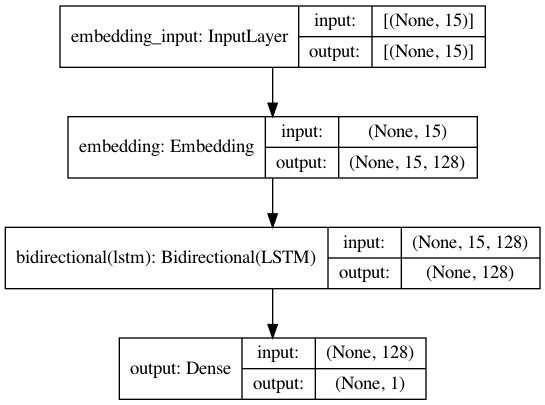

In [63]:
plot_model(models[0], show_shapes=True)

In [64]:
## Retrieve the summary of results from the tuner
tuner.results_summary()

## Explanation

### Train Model with the Tuned Hyperparameters

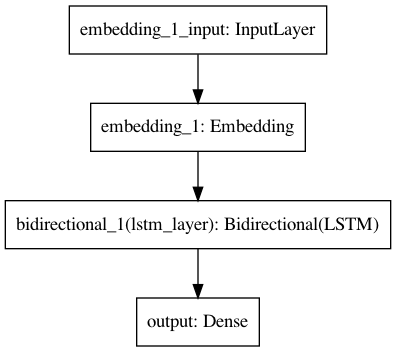

In [65]:
EMBEDDING_DIM = 128
HIDDEN_STATE= 128
model6 = Sequential()
model6.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model6.add(
    layers.Bidirectional(
        layers.LSTM(HIDDEN_STATE,
                    activation="relu",
                    name="lstm_layer",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model6.add(layers.Dense(1, activation="sigmoid", name="output"))

model6.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])
plot_model(model6)

In [66]:
history6 = model6.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 10s - loss: 0.6365 - accuracy: 0.6271 - val_loss: 0.5733 - val_accuracy: 0.6672
Epoch 2/20
40/40 - 3s - loss: 0.5164 - accuracy: 0.7392 - val_loss: 0.4581 - val_accuracy: 0.7608
Epoch 3/20
40/40 - 4s - loss: 0.4653 - accuracy: 0.7744 - val_loss: 0.4323 - val_accuracy: 0.7844
Epoch 4/20
40/40 - 4s - loss: 0.4379 - accuracy: 0.7834 - val_loss: 0.4132 - val_accuracy: 0.7915
Epoch 5/20
40/40 - 4s - loss: 0.4277 - accuracy: 0.7925 - val_loss: 0.4039 - val_accuracy: 0.8088
Epoch 6/20
40/40 - 4s - loss: 0.4187 - accuracy: 0.7978 - val_loss: 0.4019 - val_accuracy: 0.8065
Epoch 7/20
40/40 - 3s - loss: 0.4119 - accuracy: 0.8023 - val_loss: 0.3956 - val_accuracy: 0.8112
Epoch 8/20
40/40 - 3s - loss: 0.4088 - accuracy: 0.8027 - val_loss: 0.3970 - val_accuracy: 0.8080
Epoch 9/20
40/40 - 4s - loss: 0.4060 - accuracy: 0.8065 - val_loss: 0.3890 - val_accuracy: 0.8104
Epoch 10/20
40/40 - 3s - loss: 0.3985 - accuracy: 0.8098 - val_loss: 0.3872 - val_accuracy: 0.8104
Epoch 11/20
40/40 

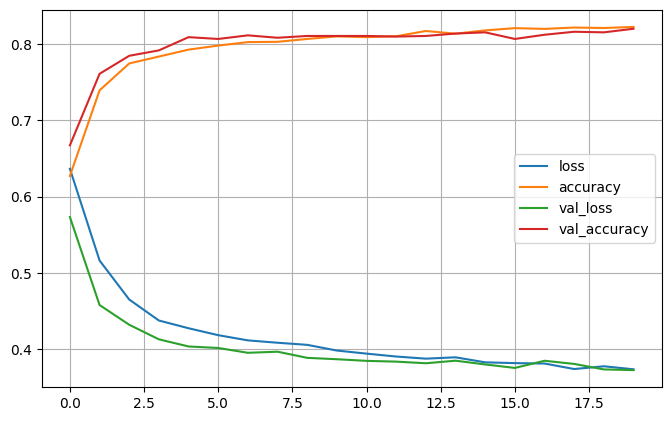

In [67]:
plot2(history6)

In [68]:
explainer = LimeTextExplainer(class_names=['male'], char_level=True)

In [69]:
def model_predict_pipeline(text):
    _seq = tokenizer.texts_to_sequences(text)
    _seq_pad = keras.preprocessing.sequence.pad_sequences(_seq, maxlen=max_len)
    #return np.array([[float(1-x), float(x)] for x in model.predict(np.array(_seq_pad))])
    return model6.predict(np.array(_seq_pad))

In [70]:
reversed_word_index = dict([(index, word)
                            for (word, index) in tokenizer.word_index.items()])

In [71]:
text_id = 305

In [72]:
X_test[text_id]

array([ 0,  0,  0,  0,  0,  0, 17,  2,  5,  1,  6, 10,  3,  4,  1],
      dtype=int32)

In [73]:
X_test_texts[text_id]

'Geraldina'

In [74]:
' '.join([reversed_word_index.get(i, '?') for i in X_test[text_id]])

'? ? ? ? ? ? g e r a l d i n a'

In [75]:
model_predict_pipeline([X_test_texts[text_id]])

array([[0.00083253]], dtype=float32)

In [76]:
exp = explainer.explain_instance(X_test_texts[text_id],
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)

In [77]:
exp.show_in_notebook(text=True)

In [78]:
y_test[text_id]

0

In [79]:
exp = explainer.explain_instance('Tim',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [80]:
exp = explainer.explain_instance('Michaelis',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [81]:
exp = explainer.explain_instance('Sidney',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [82]:
exp = explainer.explain_instance('Timber',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [83]:
exp = explainer.explain_instance('Alvin',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

## References

- Chollet (2017), Ch 3 and  Ch 4